In [1]:
words =  open('names.txt' , 'r').read().splitlines()

In [2]:
words[:10]

['emma',
 'olivia',
 'ava',
 'isabella',
 'sophia',
 'charlotte',
 'mia',
 'amelia',
 'harper',
 'evelyn']

In [5]:
b ={}
for w in words:
    chs  = ["<S>"] + list(w) + ["<E>"]
    for ch1, ch2 in zip(chs, chs[1:]):
        bigram = (ch1, ch2)
        b[bigram] = b.get(bigram, 0) + 1
        print(ch1, ch2)

<S> e
e m
m m
m a
a <E>
<S> o
o l
l i
i v
v i
i a
a <E>
<S> a
a v
v a
a <E>
<S> i
i s
s a
a b
b e
e l
l l
l a
a <E>
<S> s
s o
o p
p h
h i
i a
a <E>
<S> c
c h
h a
a r
r l
l o
o t
t t
t e
e <E>
<S> m
m i
i a
a <E>
<S> a
a m
m e
e l
l i
i a
a <E>
<S> h
h a
a r
r p
p e
e r
r <E>
<S> e
e v
v e
e l
l y
y n
n <E>
<S> a
a b
b i
i g
g a
a i
i l
l <E>
<S> e
e m
m i
i l
l y
y <E>
<S> e
e l
l i
i z
z a
a b
b e
e t
t h
h <E>
<S> m
m i
i l
l a
a <E>
<S> e
e l
l l
l a
a <E>
<S> a
a v
v e
e r
r y
y <E>
<S> s
s o
o f
f i
i a
a <E>
<S> c
c a
a m
m i
i l
l a
a <E>
<S> a
a r
r i
i a
a <E>
<S> s
s c
c a
a r
r l
l e
e t
t t
t <E>
<S> v
v i
i c
c t
t o
o r
r i
i a
a <E>
<S> m
m a
a d
d i
i s
s o
o n
n <E>
<S> l
l u
u n
n a
a <E>
<S> g
g r
r a
a c
c e
e <E>
<S> c
c h
h l
l o
o e
e <E>
<S> p
p e
e n
n e
e l
l o
o p
p e
e <E>
<S> l
l a
a y
y l
l a
a <E>
<S> r
r i
i l
l e
e y
y <E>
<S> z
z o
o e
e y
y <E>
<S> n
n o
o r
r a
a <E>
<S> l
l i
i l
l y
y <E>
<S> e
e l
l e
e a
a n
n o
o r
r <E>
<S> h
h a
a n
n n
n a
a 

In [9]:
sorted(b.items(), key=lambda kv: -kv[1])

[(('n', '<E>'), 6763),
 (('a', '<E>'), 6640),
 (('a', 'n'), 5438),
 (('<S>', 'a'), 4410),
 (('e', '<E>'), 3983),
 (('a', 'r'), 3264),
 (('e', 'l'), 3248),
 (('r', 'i'), 3033),
 (('n', 'a'), 2977),
 (('<S>', 'k'), 2963),
 (('l', 'e'), 2921),
 (('e', 'n'), 2675),
 (('l', 'a'), 2623),
 (('m', 'a'), 2590),
 (('<S>', 'm'), 2538),
 (('a', 'l'), 2528),
 (('i', '<E>'), 2489),
 (('l', 'i'), 2480),
 (('i', 'a'), 2445),
 (('<S>', 'j'), 2422),
 (('o', 'n'), 2411),
 (('h', '<E>'), 2409),
 (('r', 'a'), 2356),
 (('a', 'h'), 2332),
 (('h', 'a'), 2244),
 (('y', 'a'), 2143),
 (('i', 'n'), 2126),
 (('<S>', 's'), 2055),
 (('a', 'y'), 2050),
 (('y', '<E>'), 2007),
 (('e', 'r'), 1958),
 (('n', 'n'), 1906),
 (('y', 'n'), 1826),
 (('k', 'a'), 1731),
 (('n', 'i'), 1725),
 (('r', 'e'), 1697),
 (('<S>', 'd'), 1690),
 (('i', 'e'), 1653),
 (('a', 'i'), 1650),
 (('<S>', 'r'), 1639),
 (('a', 'm'), 1634),
 (('l', 'y'), 1588),
 (('<S>', 'l'), 1572),
 (('<S>', 'c'), 1542),
 (('<S>', 'e'), 1531),
 (('j', 'a'), 1473),
 (

In [11]:
import torch

In [33]:
N = torch.zeros((27,27), dtype = torch.int32)

In [34]:
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}

In [35]:
for w in words:
    chs = ["."] + list(w) + ["."]
    for ch1 , ch2 in zip(chs , chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        N[ix1 , ix2] += 1

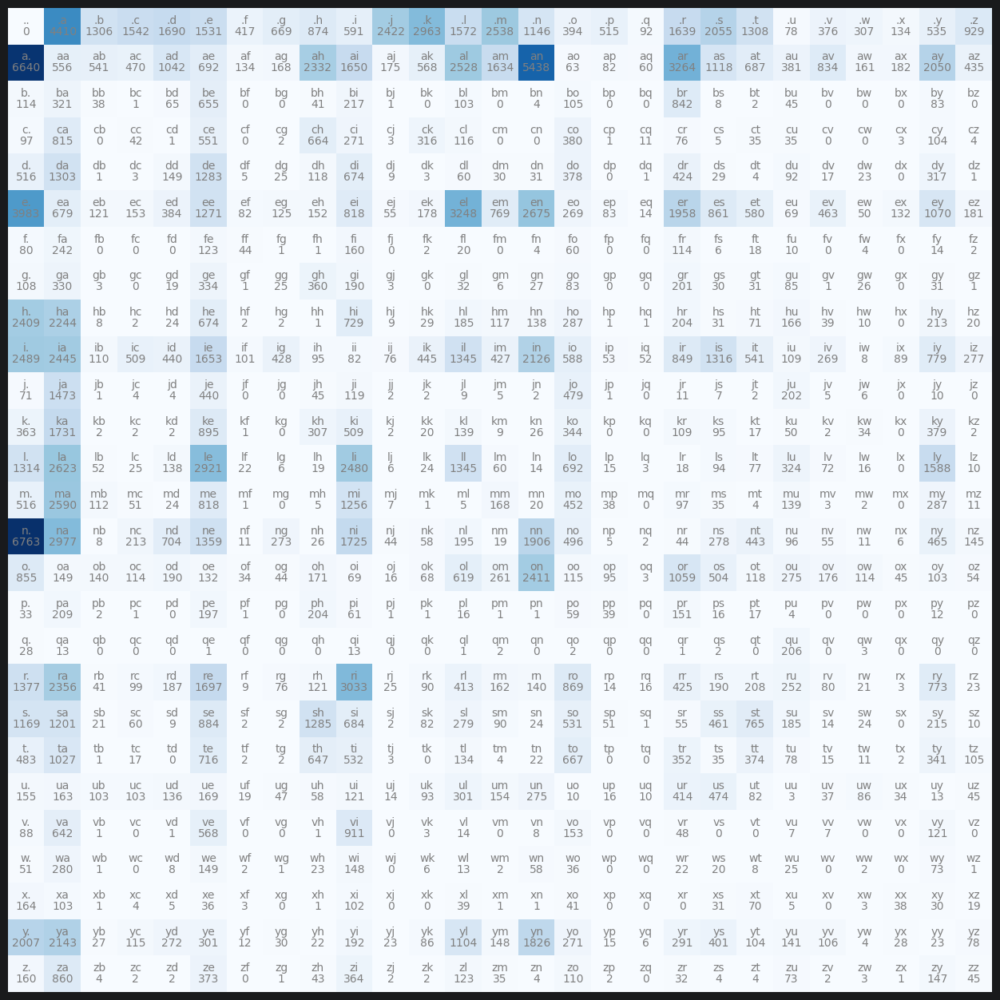

In [36]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(16,16))
plt.imshow(N , cmap = 'Blues')
for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(j , i , chstr , ha = 'center', va = 'bottom' , color = 'gray')
        plt.text(j , i , N[i,j].item() , ha = 'center', va = 'top' , color = 'gray')
plt.axis('off');

In [37]:
N[0]

tensor([   0, 4410, 1306, 1542, 1690, 1531,  417,  669,  874,  591, 2422, 2963,
        1572, 2538, 1146,  394,  515,   92, 1639, 2055, 1308,   78,  376,  307,
         134,  535,  929], dtype=torch.int32)

In [38]:
p = N[0].float()
p = p/p.sum()
p

tensor([0.0000, 0.1377, 0.0408, 0.0481, 0.0528, 0.0478, 0.0130, 0.0209, 0.0273,
        0.0184, 0.0756, 0.0925, 0.0491, 0.0792, 0.0358, 0.0123, 0.0161, 0.0029,
        0.0512, 0.0642, 0.0408, 0.0024, 0.0117, 0.0096, 0.0042, 0.0167, 0.0290])

In [53]:
g = torch.Generator().manual_seed(2147483647)
ix = torch.multinomial( p  , num_samples = 1 , replacement = True, generator = g).item()

In [67]:
P = (N+1).float()
P = P / P.sum(1, keepdim = True)

In [68]:
g = torch.Generator().manual_seed(21447483647)

for i in range(20):
    out = []
    ix = 0
    while True:
        p = P[ix]
        #p = N[ix].float()
        #p = p/p.sum()
        ix = torch.multinomial( p , num_samples = 1 , replacement = True, generator = g).item()
        out.append(itos[ix])
        if ix == 0:
            break
    print(''.join(out))


ji.
balelariohma.
deme.
de.
ma.
dan.
microrstol.
j.
leenon.
d.
sol.
d.
girdietesoyayslimanele.
jes.
zelyveleyn.
jh.
blellon.
z.
je.
k.


In [69]:
log_likelihood = 0.0
n = 0
for w in words:
    chs = ["."] + list(w) + ["."]
    for ch1 , ch2 in zip(chs , chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1, ix2]
        logprob = torch.log(prob)
        log_likelihood += logprob
        n += 1
        print(f'{ch1}{ch2}: {prob:.4f} {logprob:.4f}')
nll = -log_likelihood
print(f'{nll/n}')

.e: 0.0478 -3.0410
em: 0.0377 -3.2793
mm: 0.0253 -3.6753
ma: 0.3885 -0.9454
a.: 0.1958 -1.6305
.o: 0.0123 -4.3965
ol: 0.0779 -2.5526
li: 0.1774 -1.7293
iv: 0.0152 -4.1845
vi: 0.3508 -1.0476
ia: 0.1380 -1.9807
a.: 0.1958 -1.6305
.a: 0.1376 -1.9835
av: 0.0246 -3.7041
va: 0.2473 -1.3971
a.: 0.1958 -1.6305
.i: 0.0185 -3.9919
is: 0.0743 -2.5998
sa: 0.1478 -1.9119
ab: 0.0160 -4.1363
be: 0.2455 -1.4044
el: 0.1589 -1.8396
ll: 0.0962 -2.3408
la: 0.1876 -1.6733
a.: 0.1958 -1.6305
.s: 0.0641 -2.7468
so: 0.0654 -2.7270
op: 0.0121 -4.4180
ph: 0.1947 -1.6364
hi: 0.0955 -2.3485
ia: 0.1380 -1.9807
a.: 0.1958 -1.6305
.c: 0.0481 -3.0339
ch: 0.1869 -1.6774
ha: 0.2937 -1.2251
ar: 0.0963 -2.3405
rl: 0.0325 -3.4256
lo: 0.0496 -3.0047
ot: 0.0149 -4.2032
tt: 0.0670 -2.7031
te: 0.1281 -2.0549
e.: 0.1948 -1.6357
.m: 0.0792 -2.5358
mi: 0.1885 -1.6687
ia: 0.1380 -1.9807
a.: 0.1958 -1.6305
.a: 0.1376 -1.9835
am: 0.0482 -3.0321
me: 0.1228 -2.0971
el: 0.1589 -1.8396
li: 0.1774 -1.7293
ia: 0.1380 -1.9807
a.: 0.1958 -

In [70]:
xs , ys =[], []

for w in words:
    chs = ["."] + list(w) + ["."]
    for ch1 , ch2 in zip(chs , chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        xs.append(ix1)
        ys.append(ix2)

xs = torch.tensor(xs)
ys = torch.tensor(ys)

In [109]:
import torch.nn.functional as F
xenc = F.one_hot(xs, num_classes = 27).float()
xenc.shape

torch.Size([228146, 27])

In [110]:
W = torch.randn((27,27), generator= g, requires_grad=True)
logits = xenc @ W

In [111]:
counts = (logits).exp()
probs = counts / counts.sum(1 , keepdim = True)
probs

tensor([[0.0230, 0.0126, 0.1143,  ..., 0.0547, 0.0069, 0.0175],
        [0.0324, 0.0791, 0.0234,  ..., 0.0938, 0.0517, 0.0088],
        [0.0214, 0.0373, 0.1453,  ..., 0.0139, 0.0105, 0.0315],
        ...,
        [0.0506, 0.0126, 0.0174,  ..., 0.0248, 0.0107, 0.0261],
        [0.0018, 0.0191, 0.0242,  ..., 0.1255, 0.0114, 0.0088],
        [0.0357, 0.0220, 0.0194,  ..., 0.0151, 0.0096, 0.0169]],
       grad_fn=<DivBackward0>)

In [112]:
nlls = torch.zeros(5)
for i in range(5):
    x = xs[i].item()
    y = ys[i].item()

    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    print(f'bigram example {i+1} : {itos[x]}{itos[y]} (indexes {x},{y})')
    print("input to neural net: ",x )
    print("output probabilites from neural net: ", probs[i])
    print('label (actual next character): ', y )
    p = probs [i ,y]
    print("probability assigned by the net to the correct character: ", p.item())
    logp = torch.log(p)
    print('log_likelihood: ' ,logp)
    nll = -logp
    print('negative log likelihood: ', nll.item())
    nlls[i] = nll

print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
print("average negative log likelihood, i.e loss =" , nlls.mean().item())

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
bigram example 1 : .e (indexes 0,5)
input to neural net:  0
output probabilites from neural net:  tensor([0.0230, 0.0126, 0.1143, 0.0281, 0.0211, 0.1200, 0.0071, 0.0244, 0.0459,
        0.0357, 0.0877, 0.0217, 0.0787, 0.0036, 0.0067, 0.0664, 0.0147, 0.0071,
        0.0405, 0.0324, 0.0152, 0.0334, 0.0265, 0.0541, 0.0547, 0.0069, 0.0175],
       grad_fn=<SelectBackward0>)
label (actual next character):  5
probability assigned by the net to the correct character:  0.11996793001890182
log_likelihood:  tensor(-2.1205, grad_fn=<LogBackward0>)
negative log likelihood:  2.120530843734741
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
bigram example 2 : em (indexes 5,13)
input to neural net:  5
output probabilites from neural net:  tensor([0.0324, 0.0791, 0.0234, 0.0218, 0.0238, 0.0209, 0.0116, 0.0249, 0.0173,
        0.1439, 0.0165, 0.0202, 0.0045, 0.0325, 0.0324, 0.0258, 0.0447, 0.0236,
        0.0222, 0.0673, 0.0699, 0.0422, 0.

In [113]:
torch.arange(27)

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26])

In [117]:
loss = -probs[torch.arange(len(xs)), ys].log().mean()

In [119]:
W.shape

torch.Size([27, 27])

In [122]:
#---------------------------------------ACTUAL MAKEMORE----------------------------------------------------------------------------#

In [130]:
xs , ys = [], []
for w in words:
    chs = ["."] + list(w) + ["."]
    for ch1 , ch2 in zip (chs , chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        xs.append(ix1)
        ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()
print("number of examples: ", num)

#intinalizing the network
g = torch.Generator().manual_seed(2147483637)
W = torch.randn((27,27), generator = g , requires_grad=True)

number of examples:  228146


In [185]:
for k in range (100):

    xenc = F.one_hot(xs ,num_classes = 27).float()
    logits = xenc @ W
    counts = logits.exp()
    probs = counts/ counts.sum(1 , keepdim = True)
    loss = -probs[torch.arange(num) , ys].log().mean()
    print(loss.item())

    W.grad = None
    loss.backward()

    W.data += -5 * W.grad

2.459883213043213
2.4598805904388428
2.4598782062530518
2.4598755836486816
2.4598729610443115
2.4598710536956787
2.4598686695098877
2.4598655700683594
2.4598634243011475
2.4598610401153564
2.4598584175109863
2.4598560333251953
2.459853172302246
2.459851026535034
2.459848642349243
2.459846258163452
2.459843873977661
2.459841251373291
2.4598388671875
2.45983624458313
2.459834098815918
2.459831714630127
2.459829092025757
2.459826707839966
2.4598240852355957
2.4598217010498047
2.4598193168640137
2.4598171710968018
2.4598143100738525
2.4598121643066406
2.4598097801208496
2.4598071575164795
2.4598047733306885
2.4598023891448975
2.4597997665405273
2.4597976207733154
2.4597954750061035
2.4597928524017334
2.4597902297973633
2.4597880840301514
2.4597856998443604
2.4597830772399902
2.459780693054199
2.4597785472869873
2.459775924682617
2.459773540496826
2.459771156311035
2.459768533706665
2.459766387939453
2.459764003753662
2.45976185798645
2.45975923538208
2.459756851196289
2.459754705429077
2.4

In [186]:
for i in range(5):
    out = []
    ix = 0
    while True:
        xenc = F.one_hot(torch.tensor([ix]), num_classes= 27).float()
        logits = xenc @ W
        counts = logits.exp()
        p = counts/counts.sum(1 , keepdim = True)

        ix = torch.multinomial(p, num_samples=1, replacement= True , generator=g).item()
        out.append(itos[ix])
        if ix == 0:
            break
    print(''.join(out))


rrugh.
br.
hashai.
kesonnyan.
tayrraiyanninayanaman.
